# EMA of Aluminum casted parts

Vojtech Kopecky, CTU in Prague, 2023

In [2]:
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import PyQt6
import warnings
from IPython.display import set_matplotlib_formats
import matplotlib.pyplot as plt

# Append path to sdypy-EMA project from https://github.com/sdypy/sdypy-EMA.git
sys.path.append('C:/Users/pc/PycharmProjects/sdypy-EMA/sdypy') # Change it to path on your computer

import tools as tl # Import of tools made in this project
import stat_tools as stat # Import of tools made in this project

path_to_data = ['C:/Users/pc/OneDrive - České vysoké učení technické v Praze/DATA_D/_GithubProjectData/'
                'EMA_with_sdypy/UFF_with_FRF_aluminum_casting/'] # Change it to path on your computer

tl.plt.rcParams['figure.figsize'] = [10, 6] # Set figure size

warnings.filterwarnings('ignore') # Suppres warnings

%matplotlib inline
set_matplotlib_formats('pdf', 'svg') # produce vector inline graphics

First, expected natural frequencies are set. Then objects are made for each measurement, the object will automatically find stable poles using LSCF, than it finds poles that best match the expected ones and uses them as natural frequencies. LSFD is than used to compute residuals and eigenvectors. 

In [3]:
approx_nat_freq = [1310, 1800, 3220, 3940, 5540, 6200, 6240, 7150, 7450, 7800, 8450, 8710, 8850, 9000, 9300,
                   9700]

In [4]:
measurements = []

def procClosest(path):
    part = tl.ModelEMA(path_to_data[0], path, binsize=50)

    part.get_stable_poles()

    part.select_closest_poles(approx_nat_freq)

    part.reconstruct_avg()
    
    measurements.append(part)
    
    return part

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 81.59it/s]


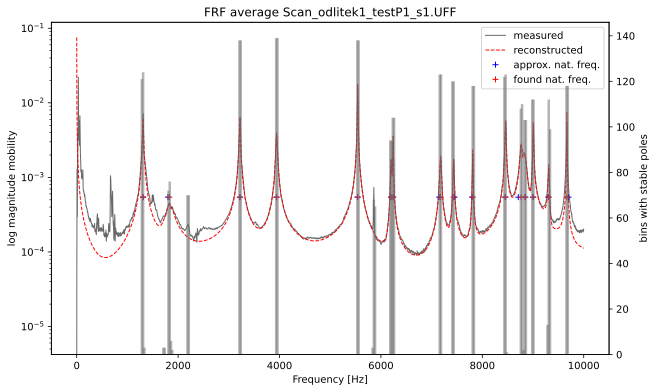

In [5]:
p11 = procClosest('Scan_odlitek1_testP1_s1.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 80.90it/s]


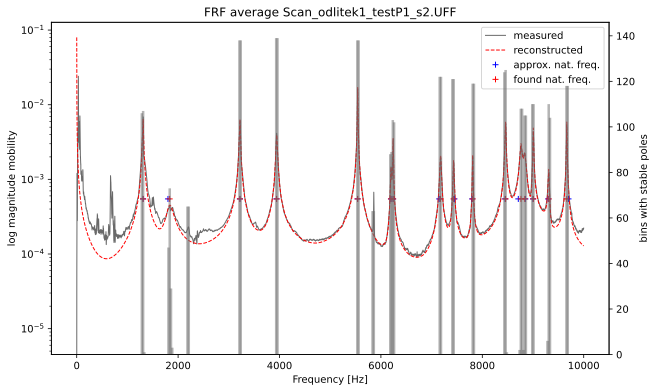

In [6]:
p12 = procClosest('Scan_odlitek1_testP1_s2.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 85.00it/s]


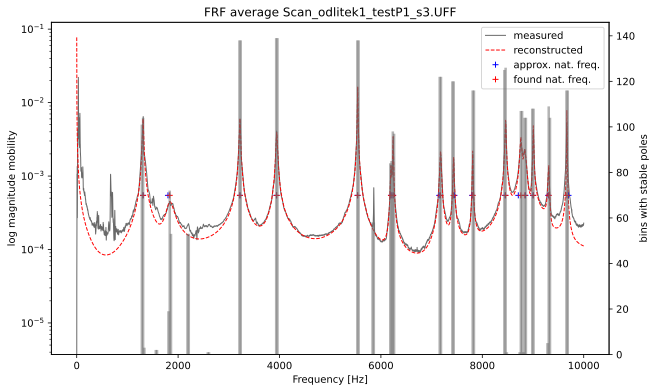

In [7]:
p13 = procClosest('Scan_odlitek1_testP1_s3.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 84.80it/s]


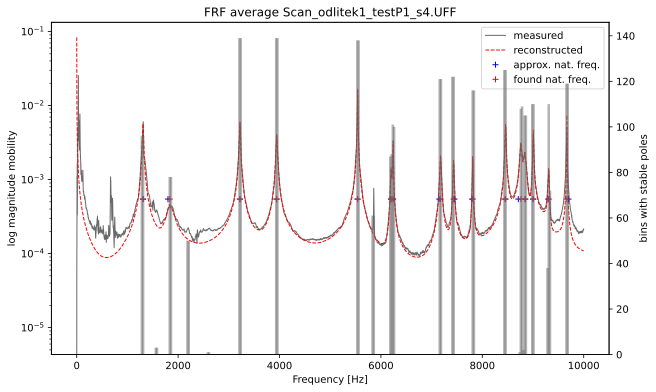

In [8]:
p14 = procClosest('Scan_odlitek1_testP1_s4.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 83.32it/s]


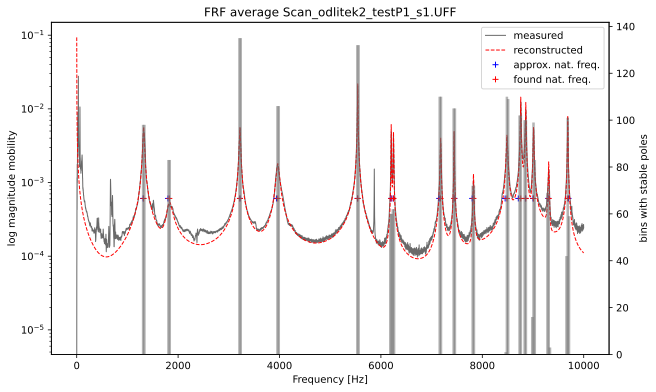

In [9]:
p21 = procClosest('Scan_odlitek2_testP1_s1.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 82.29it/s]


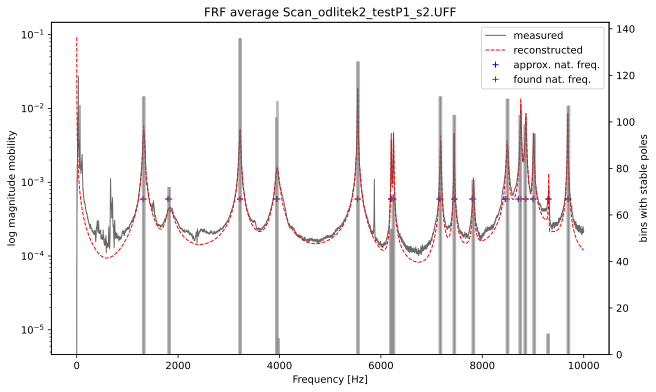

In [10]:
p22 = procClosest('Scan_odlitek2_testP1_s2.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 84.87it/s]


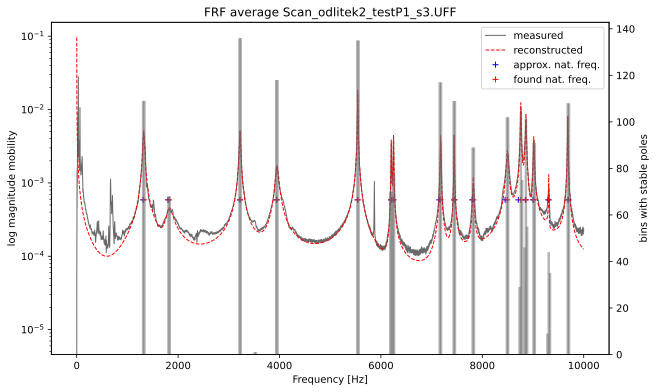

In [11]:
p23 = procClosest('Scan_odlitek2_testP1_s3.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 85.28it/s]


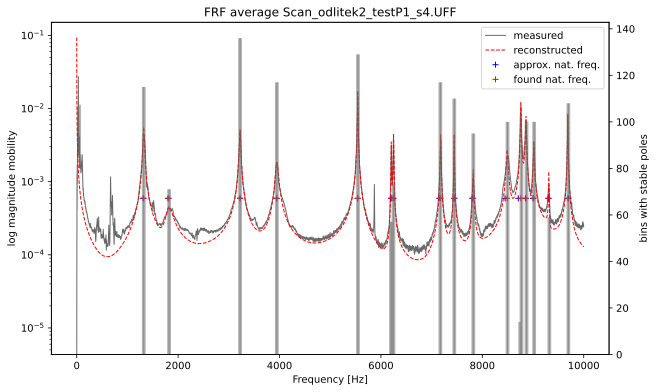

In [12]:
p24 = procClosest('Scan_odlitek2_testP1_s4.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 82.91it/s]


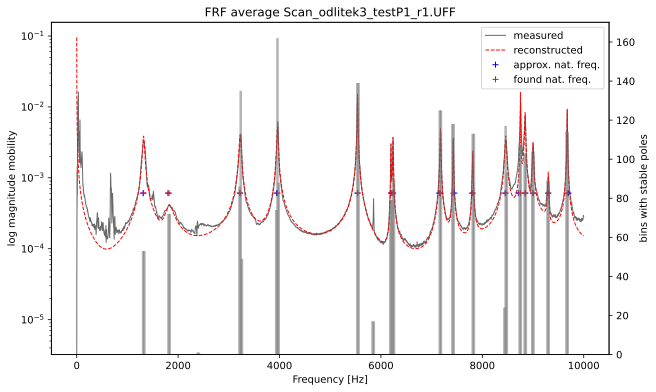

In [13]:
p31 = procClosest('Scan_odlitek3_testP1_r1.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 81.86it/s]


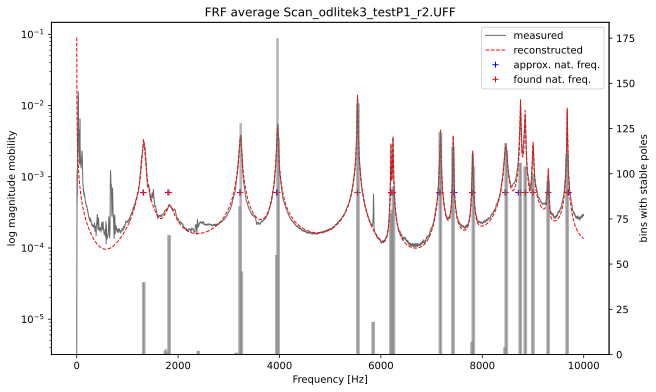

In [14]:
p32 = procClosest('Scan_odlitek3_testP1_r2.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 85.62it/s]


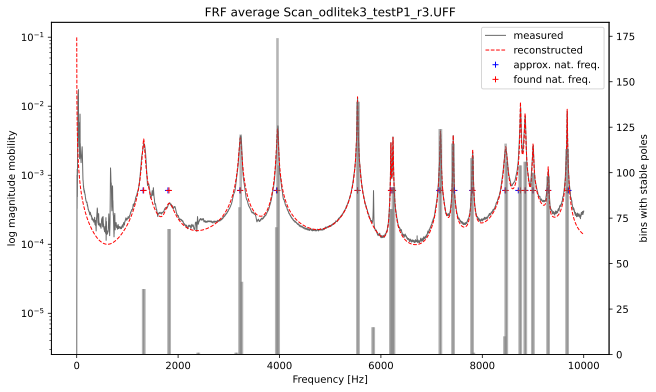

In [15]:
p33 = procClosest('Scan_odlitek3_testP1_r3.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 85.74it/s]


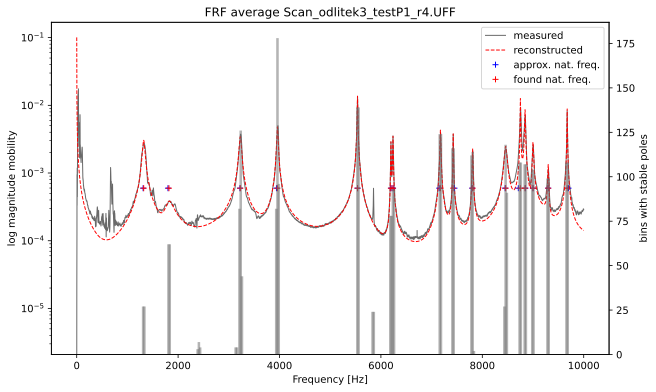

In [16]:
p34 = procClosest('Scan_odlitek3_testP1_r4.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 83.96it/s]


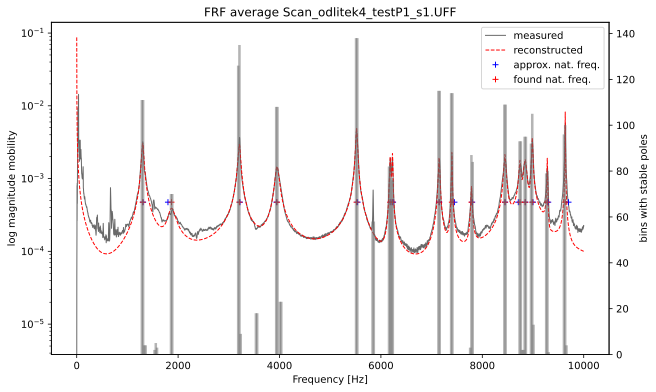

In [17]:
p41 = procClosest('Scan_odlitek4_testP1_s1.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 82.32it/s]


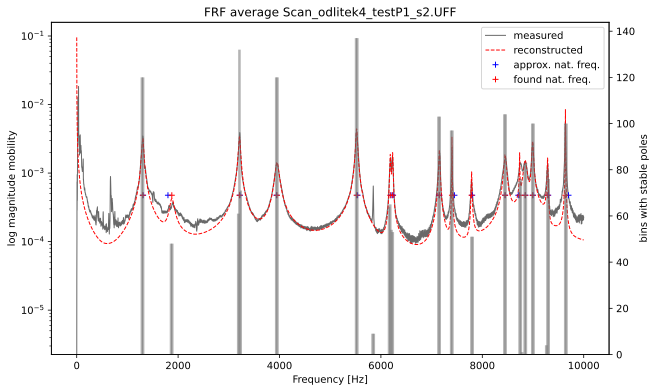

In [18]:
p42 = procClosest('Scan_odlitek4_testP1_s2.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 86.87it/s]


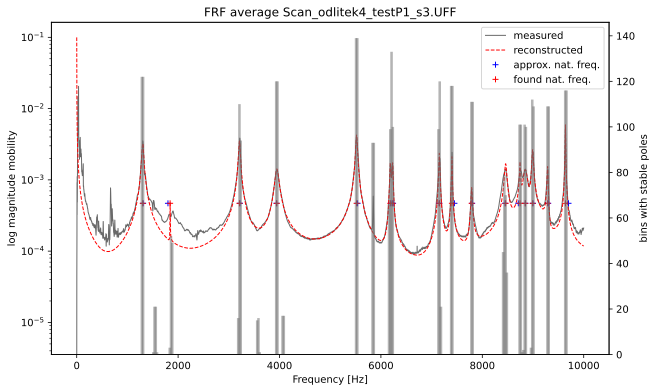

In [19]:
p43 = procClosest('Scan_odlitek4_testP1_s3.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 83.85it/s]


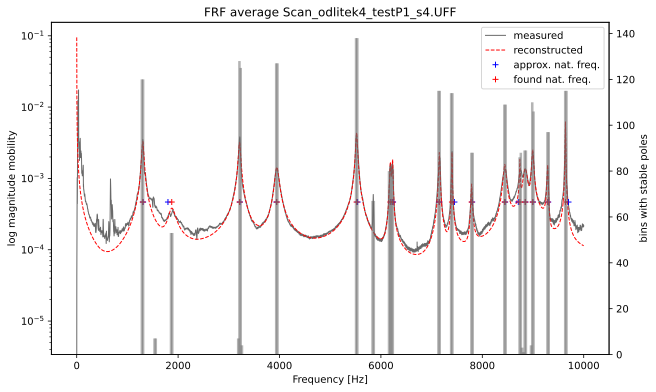

In [20]:
p44 = procClosest('Scan_odlitek4_testP1_s4.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 85.45it/s]


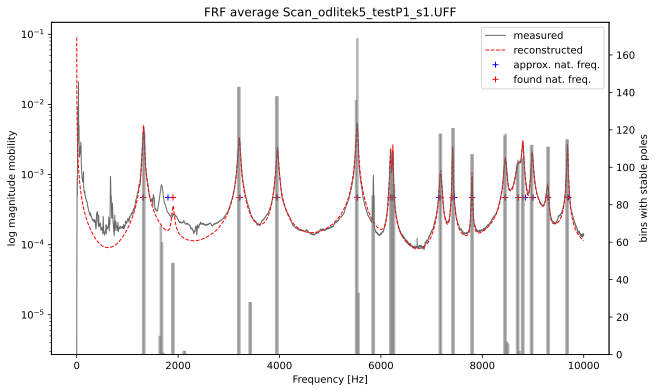

In [21]:
p51 = procClosest('Scan_odlitek5_testP1_s1.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 82.55it/s]


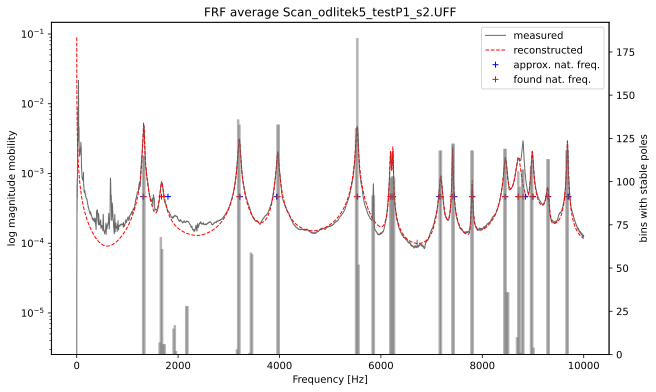

In [22]:
p52 = procClosest('Scan_odlitek5_testP1_s2.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 84.18it/s]


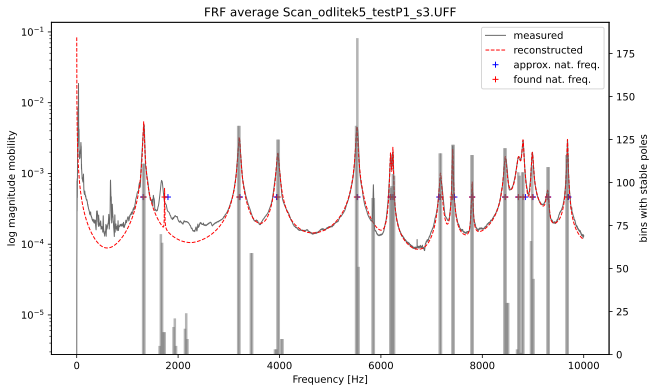

In [23]:
p53 = procClosest('Scan_odlitek5_testP1_s3.UFF')

100%|█████████████████████████████████████████████████████████████| 150/150 [00:01<00:00, 83.63it/s]


[ 11.61794542 124.2814246  -13.62831534  27.21046765 -15.63220577
 -11.49801873  -2.18890063  29.11079095 -32.56934978   2.28548414
   3.70203487   7.41781133 -43.69714448 -12.36517056  -2.8066304
 -17.74968452]


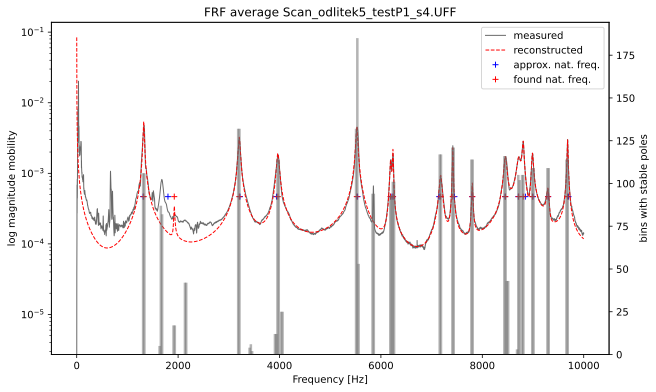

In [24]:
p54 = procClosest('Scan_odlitek5_testP1_s4.UFF')

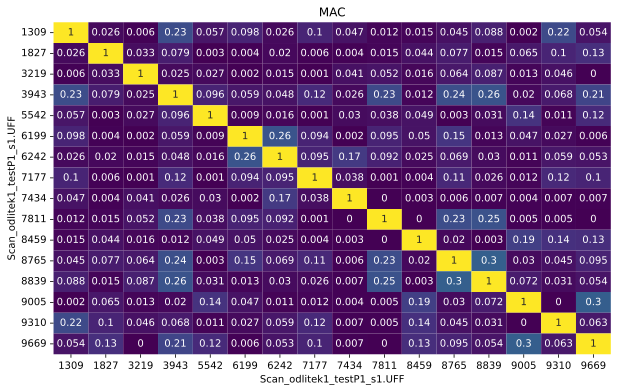

In [25]:
MAC11 = tl.prettyMAC(p11, p11)

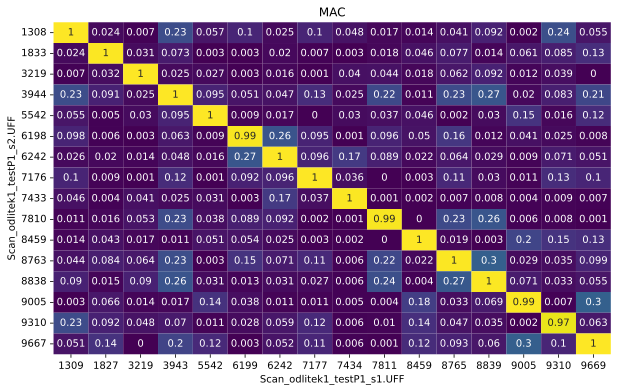

In [26]:
MAC12 = tl.prettyMAC(p11, p12)

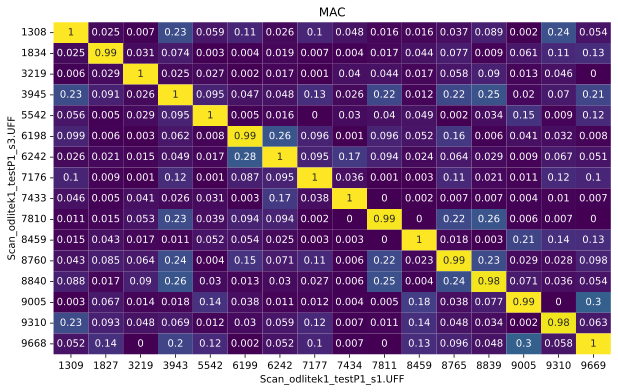

In [27]:
MAC13 = tl.prettyMAC(p11, p13)

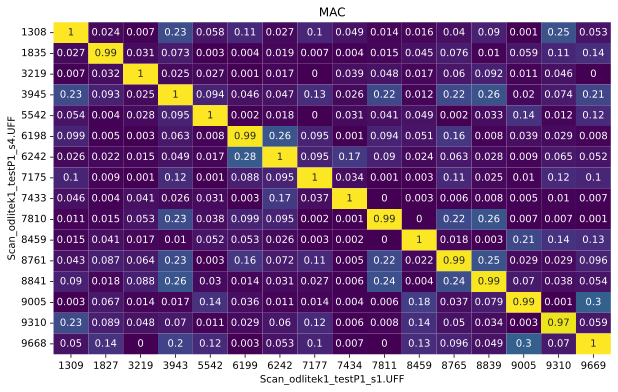

In [28]:
MAC14 = tl.prettyMAC(p11, p14)

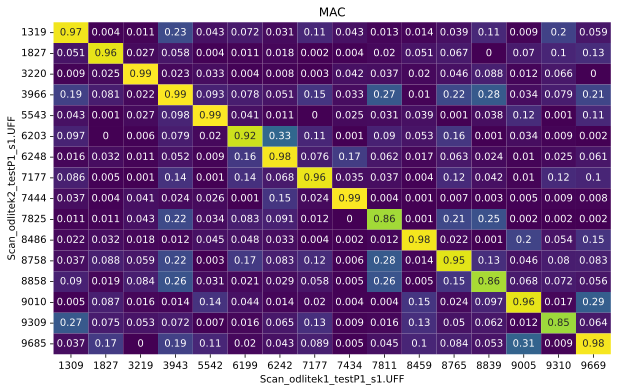

In [29]:
MAC21 = tl.prettyMAC(p11, p21)

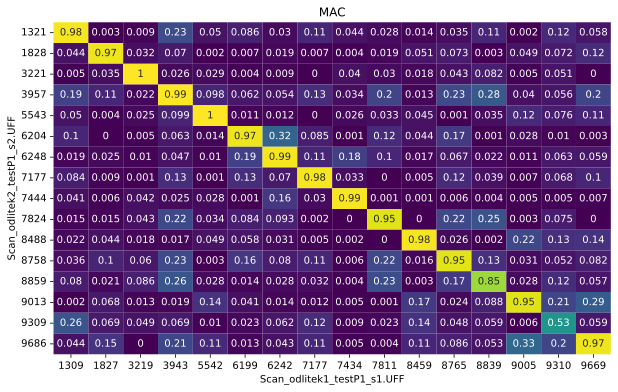

In [30]:
MAC22 = tl.prettyMAC(p11, p22)

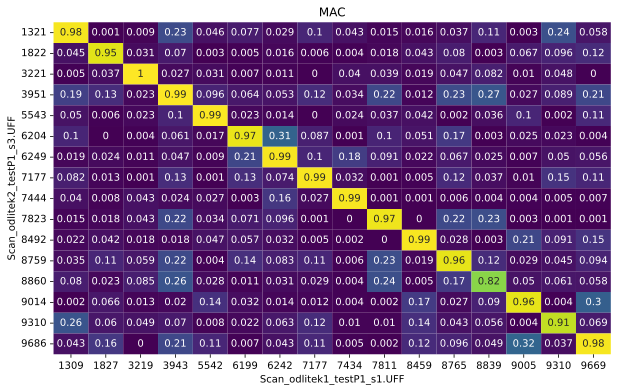

In [31]:
MAC23 = tl.prettyMAC(p11, p23)

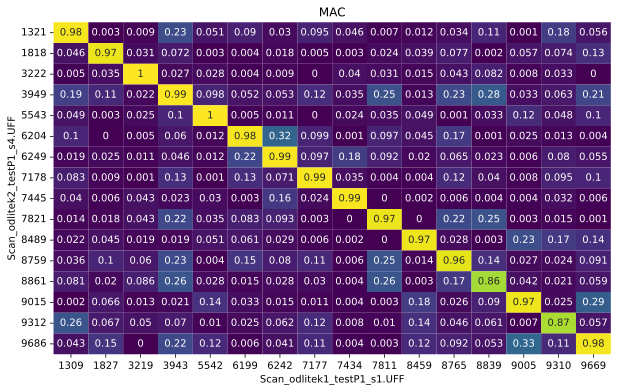

In [32]:
MAC24 = tl.prettyMAC(p11, p24)

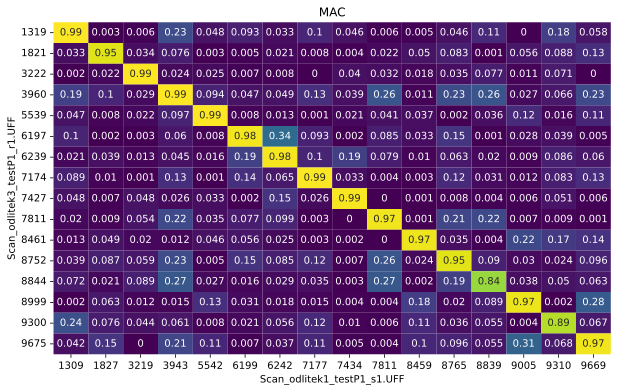

In [33]:
MAC31 = tl.prettyMAC(p11, p31)

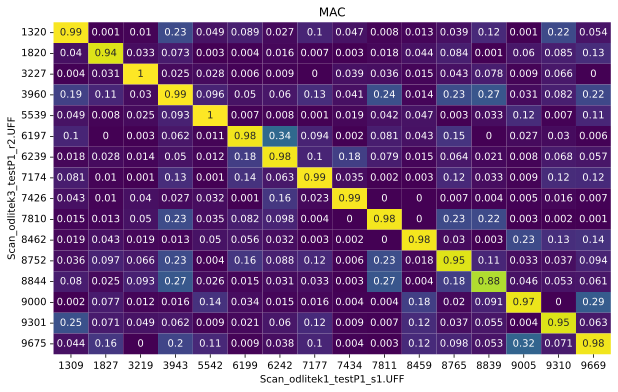

In [34]:
MAC32 = tl.prettyMAC(p11, p32)

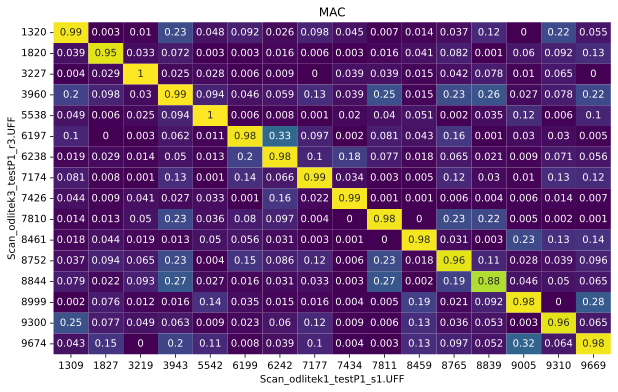

In [35]:
MAC33 = tl.prettyMAC(p11, p33)

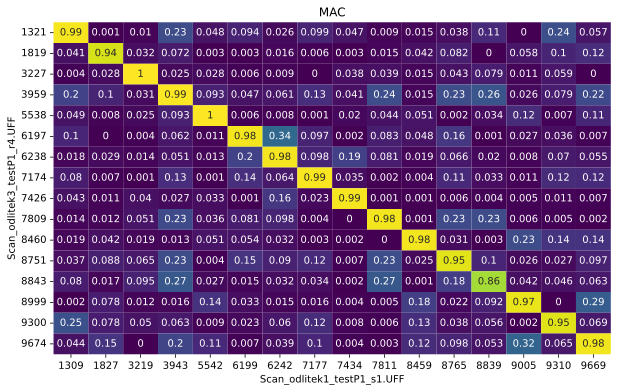

In [36]:
MAC34 = tl.prettyMAC(p11, p34)

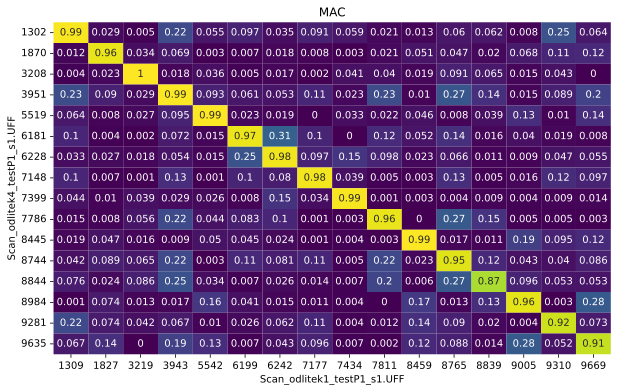

In [37]:
MAC41 = tl.prettyMAC(p11, p41)

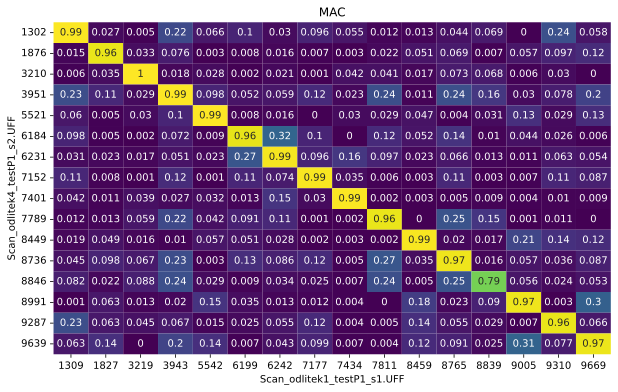

In [38]:
MAC42 = tl.prettyMAC(p11, p42)

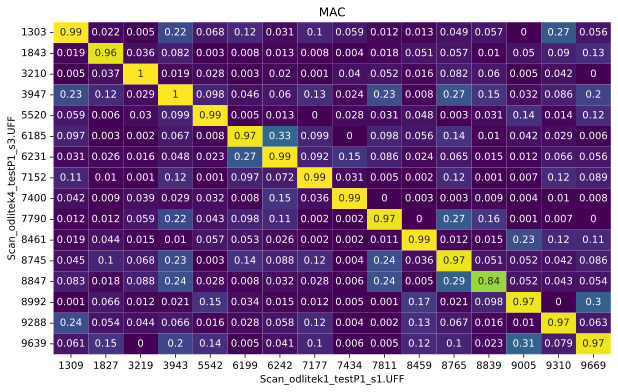

In [39]:
MAC43 = tl.prettyMAC(p11, p43)

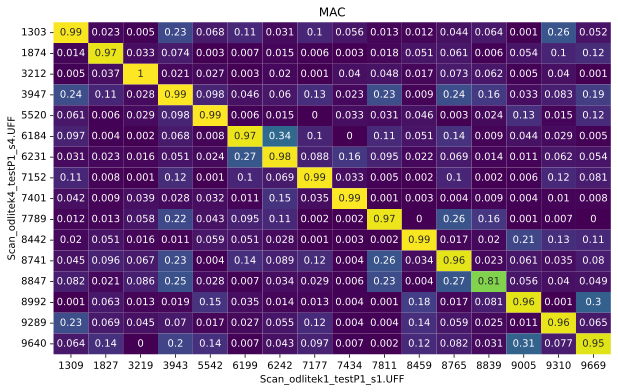

In [40]:
MAC44 = tl.prettyMAC(p11, p44)

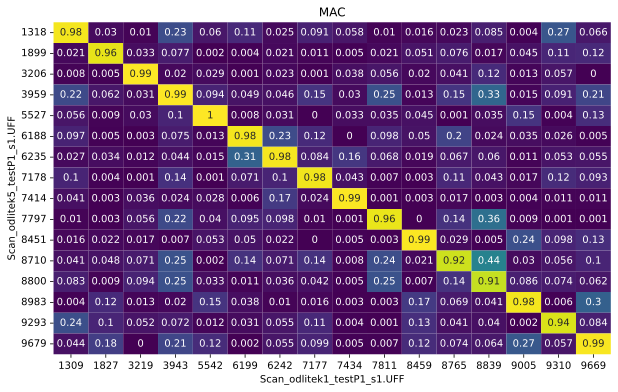

In [41]:
MAC51 = tl.prettyMAC(p11, p51)

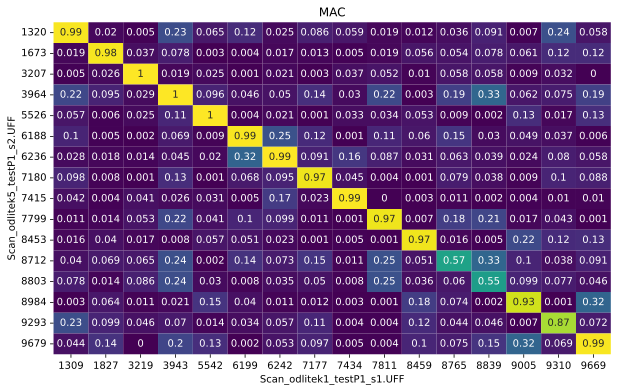

In [42]:
MAC52 = tl.prettyMAC(p11, p52)

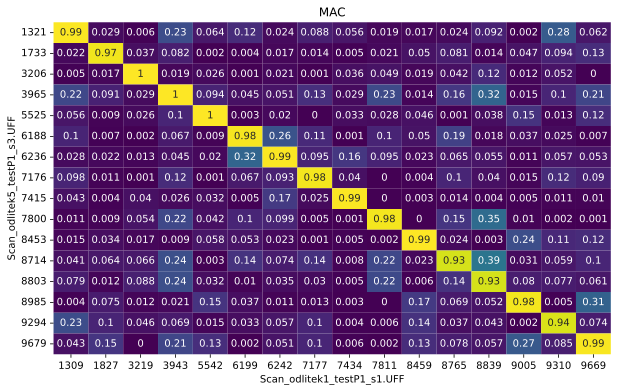

In [43]:
MAC53 = tl.prettyMAC(p11, p53)

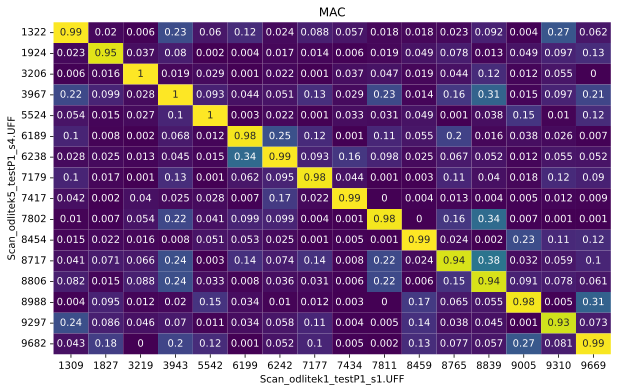

In [44]:
MAC54 = tl.prettyMAC(p11, p54)


In [45]:
backend_ =  mpl.get_backend() 
mpl.use("Agg")  # Prevent showing figures

df = pd.DataFrame(columns=['name', 'nat_freq', 'damping', 'eig_vec', 'MAC_diag']) # dataframe with predefined features

# Each measurement list measurements is processed into row of features in dataframe
for meas in measurements:
    
    eig_vec = meas.model.A.flatten() # Gets flattened matrix of eigenvectors
    
    MAC_diag = tl.prettyMAC(p11, meas, show_plot=False).to_numpy().diagonal() # Gets diagonal of MAC with reference measurement
    
    df.loc[len(df.index)] = [
                            meas.name,
                            meas.nat_freq,
                            meas.nat_xi,
                            eig_vec,
                            MAC_diag
                            ]

mpl.use(backend_)

In [46]:
Labels = [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4]
Colors = ['lightsteelblue', 'royalblue', 'navy', 'firebrick', 'orange']
target_names = ['part_1_unbroken', 'part_2_unbroken', 'part_3_unbroken', 'part_4_broken', 'part_5_broken']

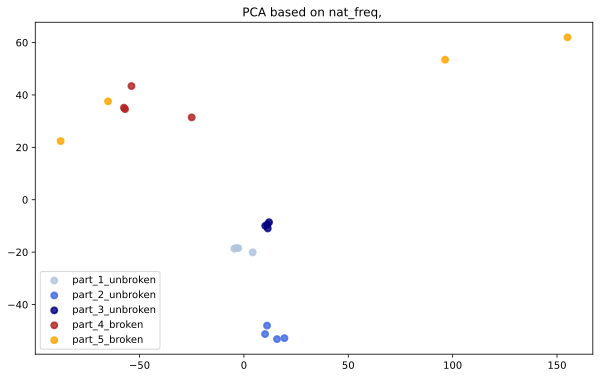

In [47]:
features = ['nat_freq']
pca = stat.PCA(df, features, Labels, Colors, target_names)